### Try-it 8.1: The "Best" Model

This module was all about regression and using Python's scikitlearn library to build regression models.  Below, a dataset related to real estate prices in California is given. While many of the assignments you have built and evaluated different models, it is important to spend some time interpreting the resulting "best" model.  


Your goal is to build a regression model to predict the price of a house in California.  After doing so, you are to *interpret* the model.  There are many strategies for doing so, including some built in methods from scikitlearn.  One example is `permutation_importance`.  Permutation feature importance is a strategy for inspecting a model and its features importance.  

Take a look at the user guide for `permutation_importance` [here](https://scikit-learn.org/stable/modules/permutation_importance.html).  Use  the `sklearn.inspection` modules implementation of `permutation_importance` to investigate the importance of different features to your regression models.  Share these results on the discussion board.

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from plotly.figure_factory import create_table
from pandas.plotting import scatter_matrix
from sklearn.impute import SimpleImputer
from sklearn.inspection import permutation_importance
from sklearn.pipeline import Pipeline
from sklearn.compose import make_column_transformer, make_column_selector
from sklearn.preprocessing import OneHotEncoder, OrdinalEncoder, PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import StratifiedShuffleSplit
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import quantile_transform, QuantileTransformer
from sklearn.metrics import mean_squared_error
import warnings

warnings.filterwarnings("ignore")

In [2]:
cali = pd.read_csv('data/housing.csv')

In [3]:
cali.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY


In [4]:
cali.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20640 entries, 0 to 20639
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   longitude           20640 non-null  float64
 1   latitude            20640 non-null  float64
 2   housing_median_age  20640 non-null  float64
 3   total_rooms         20640 non-null  float64
 4   total_bedrooms      20433 non-null  float64
 5   population          20640 non-null  float64
 6   households          20640 non-null  float64
 7   median_income       20640 non-null  float64
 8   median_house_value  20640 non-null  float64
 9   ocean_proximity     20640 non-null  object 
dtypes: float64(9), object(1)
memory usage: 1.6+ MB


In [5]:
cali.describe()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
count,20640.000000,20640.000000,20640.000000,20640.000000,20433.000000,20640.000000,20640.000000,20640.000000,20640.000000
mean,-119.569704,35.631861,28.639486,2635.763081,537.870553,1425.476744,499.539680,3.870671,206855.816909
std,2.003532,2.135952,12.585558,2181.615252,421.385070,1132.462122,382.329753,1.899822,115395.615874
min,-124.350000,32.540000,1.000000,2.000000,1.000000,3.000000,1.000000,0.499900,14999.000000
25%,-121.800000,33.930000,18.000000,1447.750000,296.000000,787.000000,280.000000,2.563400,119600.000000
50%,-118.490000,34.260000,29.000000,2127.000000,435.000000,1166.000000,409.000000,3.534800,179700.000000
75%,-118.010000,37.710000,37.000000,3148.000000,647.000000,1725.000000,605.000000,4.743250,264725.000000
max,-114.310000,41.950000,52.000000,39320.000000,6445.000000,35682.000000,6082.000000,15.000100,500001.000000


array([[<Axes: title={'center': 'longitude'}>,
        <Axes: title={'center': 'latitude'}>,
        <Axes: title={'center': 'housing_median_age'}>],
       [<Axes: title={'center': 'total_rooms'}>,
        <Axes: title={'center': 'total_bedrooms'}>,
        <Axes: title={'center': 'population'}>],
       [<Axes: title={'center': 'households'}>,
        <Axes: title={'center': 'median_income'}>,
        <Axes: title={'center': 'median_house_value'}>]], dtype=object)

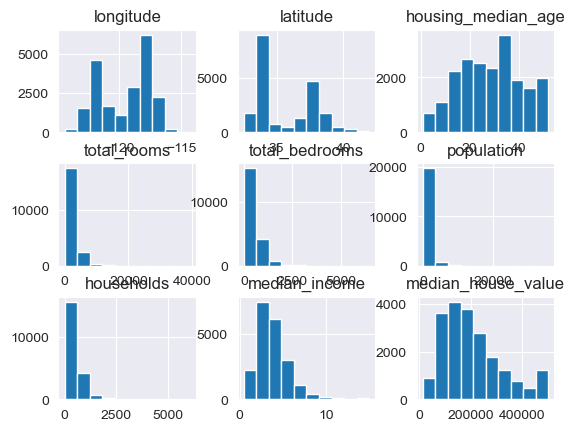

In [6]:
cali.hist()

### Data Cleaning

In [7]:
cali['ocean_proximity'].value_counts()

ocean_proximity
<1H OCEAN     9136
INLAND        6551
NEAR OCEAN    2658
NEAR BAY      2290
ISLAND           5
Name: count, dtype: int64

In [8]:
ordinal_encoder = OrdinalEncoder()
cali['ocean_proximity'] = ordinal_encoder.fit_transform(cali[['ocean_proximity']])
cali[['ocean_proximity']].value_counts().reset_index()['ocean_proximity'].values

array([0., 1., 4., 3., 2.])

Dealing with NaN

In [9]:
#as the sample is small fill NaN values with median of total bedrooms
median = cali["total_bedrooms"].median()
cali["total_bedrooms"].fillna(median, inplace = True)

In [10]:
cali.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20640 entries, 0 to 20639
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   longitude           20640 non-null  float64
 1   latitude            20640 non-null  float64
 2   housing_median_age  20640 non-null  float64
 3   total_rooms         20640 non-null  float64
 4   total_bedrooms      20640 non-null  float64
 5   population          20640 non-null  float64
 6   households          20640 non-null  float64
 7   median_income       20640 non-null  float64
 8   median_house_value  20640 non-null  float64
 9   ocean_proximity     20640 non-null  float64
dtypes: float64(10)
memory usage: 1.6 MB


### Analysing Data

Looking for Correlations

In [11]:
#wanted to see the whole matrix and limited the decimals for better readability
corr_matrix = pd.DataFrame(cali.corr())
corr_matrix = corr_matrix.round(decimals = 2)

#in jupyter use display here instead of print
display(corr_matrix)

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
longitude,1.00,-0.92,-0.11,0.04,0.07,0.10,0.06,-0.02,-0.05,-0.29
latitude,-0.92,1.00,0.01,-0.04,-0.07,-0.11,-0.07,-0.08,-0.14,0.20
housing_median_age,-0.11,0.01,1.00,-0.36,-0.32,-0.30,-0.30,-0.12,0.11,0.11
total_rooms,0.04,-0.04,-0.36,1.00,0.93,0.86,0.92,0.20,0.13,-0.02
total_bedrooms,0.07,-0.07,-0.32,0.93,1.00,0.87,0.97,-0.01,0.05,-0.01
population,0.10,-0.11,-0.30,0.86,0.87,1.00,0.91,0.00,-0.02,-0.07
households,0.06,-0.07,-0.30,0.92,0.97,0.91,1.00,0.01,0.07,-0.02
median_income,-0.02,-0.08,-0.12,0.20,-0.01,0.00,0.01,1.00,0.69,-0.01
median_house_value,-0.05,-0.14,0.11,0.13,0.05,-0.02,0.07,0.69,1.00,0.08
ocean_proximity,-0.29,0.20,0.11,-0.02,-0.01,-0.07,-0.02,-0.01,0.08,1.00


In [12]:
corr_matrix["median_house_value"].sort_values(ascending = False)

median_house_value    1.00
median_income         0.69
total_rooms           0.13
housing_median_age    0.11
ocean_proximity       0.08
households            0.07
total_bedrooms        0.05
population           -0.02
longitude            -0.05
latitude             -0.14
Name: median_house_value, dtype: float64

In [13]:
create_table(corr_matrix["median_house_value"].sort_values(ascending = False).to_frame(),index_title='features',index=True,)

Observations:
* median income seems to be an important factor with a correlation of about 0.7
* next biggest but small correlation of about 0.1/-0.1 with the rest features
* I think the lower negative latitude correlation can be explained with that lower latitude values indicate more closeness to the coast, and the coast tends to have higher housing prices.

### Normalization
A QuantileTransformer is used to normalize the target distribution before applying a RidgeCV (LinearRegression) model.

In [14]:
trans = QuantileTransformer(n_quantiles=1000, output_distribution='normal')
trans_array = trans.fit_transform(cali)
cali_norm = pd.DataFrame(trans_array)
named_columns = cali.columns
numer_couluns = cali_norm.copy().columns
tuples = [(key, value) for i, (key, value) in enumerate(zip(numer_couluns, named_columns))]
colums = dict(tuples)
cali_norm.rename(columns=colums, inplace=True)
cali_norm

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
0,-1.135284,0.905189,0.910873,-1.374878,-1.705570,-1.732267,-1.664082,1.923747,1.540068,0.893908
1,-1.123415,0.892038,-0.483658,1.839927,1.446104,1.201214,1.624101,1.918411,1.183970,0.893908
2,-1.149742,0.886449,5.199338,-0.662203,-1.337127,-1.323952,-1.327982,1.632479,1.147346,0.893908
3,-1.169401,0.886449,5.199338,-0.880888,-1.066304,-1.187827,-1.066304,1.073235,1.080589,0.893908
4,-1.169401,0.886449,5.199338,-0.467895,-0.795322,-1.174387,-0.807429,0.188015,1.086851,0.893908
...,...,...,...,...,...,...,...,...,...,...
20635,-0.405221,1.864320,-0.239380,-0.432563,-0.267884,-0.564267,-0.393847,-1.676469,-1.366675,0.257495
20636,-0.425228,1.867608,-0.702315,-1.596111,-1.574253,-1.652773,-1.713854,-0.687318,-1.376494,0.257495
20637,-0.427976,1.853811,-0.803958,0.093437,0.188033,-0.253606,0.105580,-1.488050,-1.095556,0.257495
20638,-0.485069,1.853811,-0.702315,-0.236799,-0.120731,-0.779924,-0.293986,-1.315001,-1.247505,0.257495


In [15]:
cali_norm.describe()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
count,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000
mean,0.008321,0.002481,0.194406,-0.006196,-0.009440,-0.002325,-0.000486,0.001214,0.143770,-1.450771
std,0.991068,1.001987,1.549299,1.007496,0.995661,1.010164,1.009367,1.019522,1.427937,3.667813
min,-5.199338,-5.199338,-5.199338,-5.199338,-5.199338,-5.199338,-5.199338,-5.199338,-5.199338,-5.199338
25%,-0.658043,-0.681594,-0.702315,-0.684499,-0.684763,-0.677472,-0.668987,-0.681363,-0.678523,-5.199338
50%,0.017565,0.013801,0.018820,-0.008782,-0.003764,-0.011291,-0.002509,-0.008629,0.003764,0.257495
75%,0.681594,0.680013,0.673702,0.670252,0.662467,0.675803,0.676854,0.664171,0.677064,0.257495
max,5.199338,5.199338,5.199338,5.199338,5.199338,5.199338,5.199338,5.199338,5.199338,5.199338


array([[<Axes: title={'center': 'longitude'}>,
        <Axes: title={'center': 'latitude'}>,
        <Axes: title={'center': 'housing_median_age'}>],
       [<Axes: title={'center': 'total_rooms'}>,
        <Axes: title={'center': 'total_bedrooms'}>,
        <Axes: title={'center': 'population'}>],
       [<Axes: title={'center': 'households'}>,
        <Axes: title={'center': 'median_income'}>,
        <Axes: title={'center': 'median_house_value'}>],
       [<Axes: title={'center': 'ocean_proximity'}>, <Axes: >, <Axes: >]],
      dtype=object)

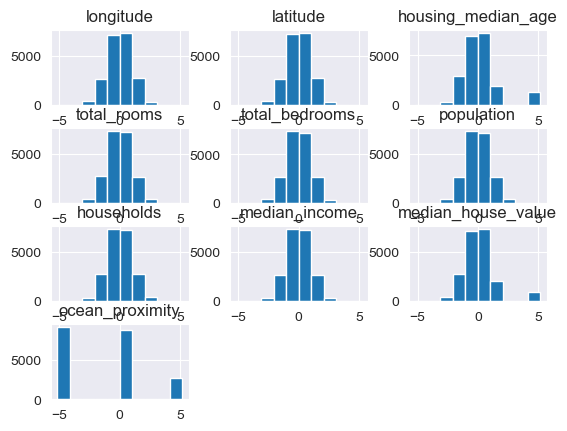

In [16]:
cali_norm.hist()

### Correlation of Normalise Dataset

In [17]:
corr_matrix_norm = pd.DataFrame(cali_norm.corr())
corr_matrix_norm = corr_matrix_norm.round(decimals = 2)
create_table(corr_matrix_norm['median_house_value'].sort_values(ascending = False).to_frame(),index_title='features',index=True,)

### Create Train/Test split

In [18]:
#Normalize data
X_norm = cali_norm.drop('median_house_value', axis = 1)
y_norm = cali_norm['median_house_value']
X_norm_train, X_norm_val, y_norm_train, y_norm_val = train_test_split(X_norm, y_norm, test_size=0.33, random_state=42)
print(X_norm_train.shape)
print(X_norm_val.shape)

(13828, 9)
(6812, 9)


In [19]:
X = cali.drop('median_house_value', axis = 1)
y = cali['median_house_value']
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.33, random_state=42)
print(X_train.shape)
print(X_val.shape)

(13828, 9)
(6812, 9)


### Creating baselines

In [20]:
baseline_train = np.ones(shape = y_train.shape)*y_train.mean()
baseline_test = np.ones(shape = y_val.shape)*y_val.mean()
mse_baseline_train = mean_squared_error(baseline_train, y_train)
mse_baseline_test = mean_squared_error(baseline_test, y_val)

print(baseline_train.shape, baseline_test.shape)
print(f'Baseline for training data: {mse_baseline_train}')
print(f'Baseline for testing data: {mse_baseline_test}')

(13828,) (6812,)
Baseline for training data: 13310260326.158108
Baseline for testing data: 13325918152.222385


### Permutation feature importance
The permutation_importance function calculates the feature importance of estimators for a given dataset.

In [21]:
from sklearn.linear_model import Ridge

model = Ridge(alpha=1e-2).fit(X_train, y_train)
r_sq = model.score(X_val, y_val)
print(f"R-squared: {r_sq}")

R-squared: 0.6308586418762061


In [22]:
model_norm = Ridge(alpha=1e-2).fit(X_norm_train, y_norm_train)
r_sq_norm = model_norm.score(X_norm_val, y_norm_val)
print(f"Norm R-squared: {r_sq_norm}")

Norm R-squared: 0.509660699876208


In [23]:
r = permutation_importance(model, X_val, y_val, n_repeats=30, random_state=0)
permutations = {}
for i in r.importances_mean.argsort()[::-1]:
    if r.importances_mean[i] - 2 * r.importances_std[i] > 0:
        print(f"{cali.columns[i]:<8} {r.importances_mean[i]:.3f} +/- {r.importances_std[i]:.3f}")
        permutations[cali.columns[i]]= [r.importances_mean[i],r.importances_std[i]]

latitude 1.246 +/- 0.016
longitude 1.105 +/- 0.019
median_income 0.874 +/- 0.012
total_bedrooms 0.365 +/- 0.007
population 0.255 +/- 0.008
total_rooms 0.049 +/- 0.002
housing_median_age 0.032 +/- 0.001
households 0.031 +/- 0.002


In [24]:
permutation_data = pd.DataFrame.from_dict(permutations, orient='index', columns=['mean', 'std'])
res_perm_data = permutation_data.reset_index()
permutation_data.reset_index()

,index,mean,std
0,latitude,1.245608,0.016080
1,longitude,1.104604,0.019306
2,median_income,0.874310,0.012498
3,total_bedrooms,0.364596,0.006649
4,population,0.254879,0.007519
5,total_rooms,0.048919,0.002422
6,housing_median_age,0.032377,0.001414
7,households,0.030509,0.001753


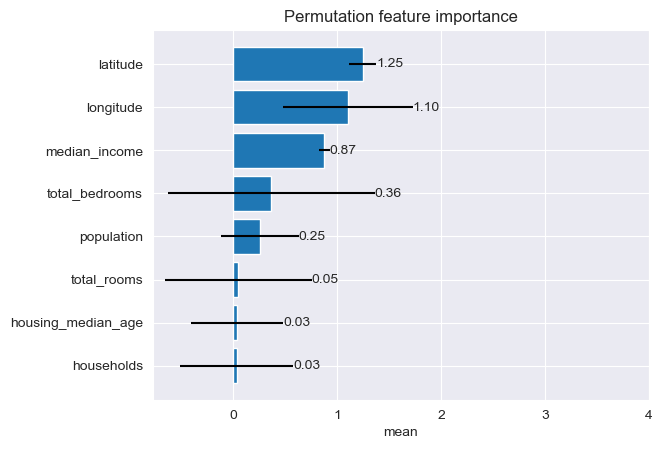

In [25]:
error = np.random.rand(res_perm_data['index'].shape[0])
fig, ax = plt.subplots()

hbars = ax.barh(res_perm_data['index'], res_perm_data['mean'], xerr=error, align='center')
ax.set_yticks(res_perm_data['index'], labels=res_perm_data['index'])
ax.invert_yaxis()  # labels read top-to-bottom
ax.set_xlabel('mean')
ax.set_title('Permutation feature importance')

# Label with specially formatted floats
ax.bar_label(hbars, fmt='%.2f')
ax.set_xlim(right=4)  # adjust xlim to fit labels

plt.show()

In [26]:
r_n = permutation_importance(model_norm, X_norm_val, y_norm_val, n_repeats=30, random_state=0)
permutations_n = {}
for i in r_n.importances_mean.argsort()[::-1]:
    if r_n.importances_mean[i] - 2 * r_n.importances_std[i] > 0:
        print(f"{cali_norm.columns[i]:<8} {r_n.importances_mean[i]:.3f} +/- {r_n.importances_std[i]:.3f}")
        permutations_n[cali_norm.columns[i]]= [r_n.importances_mean[i],r_n.importances_std[i]]

median_income 0.949 +/- 0.013
total_bedrooms 0.788 +/- 0.012
population 0.367 +/- 0.010
latitude 0.303 +/- 0.006
total_rooms 0.241 +/- 0.008
longitude 0.232 +/- 0.006
households 0.045 +/- 0.003
housing_median_age 0.035 +/- 0.002
median_house_value 0.008 +/- 0.001


In [27]:
permutation_data_n = pd.DataFrame.from_dict(permutations_n, orient='index', columns=['mean', 'std'])
res_perm_data_n = permutation_data_n.reset_index()
permutation_data_n.reset_index()

,index,mean,std
0,median_income,0.948714,0.012878
1,total_bedrooms,0.788393,0.011615
2,population,0.367239,0.010458
3,latitude,0.303152,0.006073
4,total_rooms,0.240882,0.007713
5,longitude,0.231833,0.006277
6,households,0.045037,0.002558
7,housing_median_age,0.035297,0.001890
8,median_house_value,0.007515,0.001068


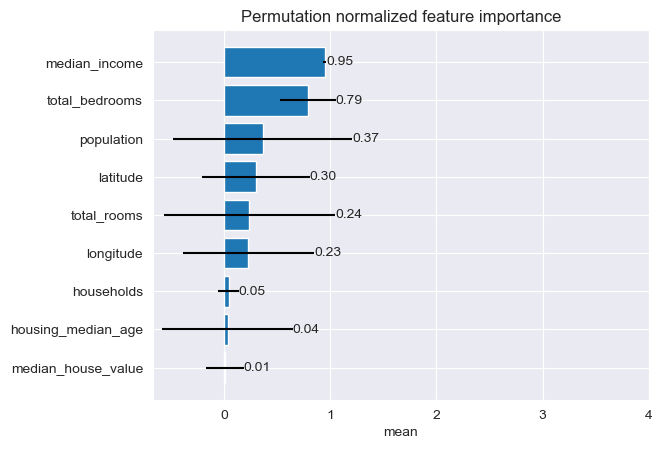

In [28]:
error = np.random.rand(res_perm_data_n['index'].shape[0])
fig, ax = plt.subplots()

hbars = ax.barh(res_perm_data_n['index'], res_perm_data_n['mean'], xerr=error, align='center')
ax.set_yticks(res_perm_data_n['index'], labels=res_perm_data_n['index'])
ax.invert_yaxis()  # labels read top-to-bottom
ax.set_xlabel('mean')
ax.set_title('Permutation normalized feature importance')

# Label with specially formatted floats
ax.bar_label(hbars, fmt='%.2f')
ax.set_xlim(right=4)  # adjust xlim to fit labels

plt.show()


In [29]:
fig = px.scatter_mapbox(cali, #our data set
                        lat="latitude", lon="longitude", #location
                        color="median_house_value", #select a column for ranking
                        hover_name="median_house_value",
                        hover_data=["total_bedrooms", "total_rooms"],
                        color_discrete_sequence=["green"],
                        size_max=30,
                        zoom=5,
                        width=800, height=1000, #map size
                        title =  'Interactive Map of California area, check location')
#style of map
fig.update_layout(mapbox_style="open-street-map")
fig.show(config={'scrollZoom': False})

### Train the model, build a pipline

In [30]:
pipes = []
train_mses = []
test_mses = []
R_square = []
X_train_pred = []
X_val_pred = []
#for degree in 1 - 5
for i in range(1, 6):
    #create pipeline with PolynomialFeatures degree i
    poly_ordinal_oe = make_column_transformer((PolynomialFeatures(degree = i), make_column_selector(dtype_include=np.number)),
                                               (OrdinalEncoder(), ['ocean_proximity']))
    pipe = Pipeline([('transformer', poly_ordinal_oe), ('linreg', LinearRegression())])

    #fit on train
    pipe.fit(X_train, y_train)
    pipes.append(pipe)
    R_square.append(pipe.score(X_train, y_train))

    #predict on train and test
    X_train_pred.append(pipe.predict(X_train))
    X_val_pred.append(pipe.predict(X_val))

    #create MSEs for train and test sets
    train_mses.append(mean_squared_error(y_train, X_train_pred[i-1]))
    test_mses.append(mean_squared_error(y_val, X_val_pred[i-1]))

# Answer check
print(train_mses)
print(test_mses)
print(f"R-square: {R_square}")
pipe

[4836678755.326477, 3931663071.3751793, 3217105684.611599, 3119621608.2529435, 2748904136.46397]
[4919147786.3756895, 4371574109.403191, 6215917319.437936, 2881144321383.163, 1922491655294416.5]
R-square: [0.636620273622962, 0.7046141115926603, 0.7582988156671021, 0.7656227953617045, 0.793474802963721]


Pipeline(steps=[('transformer',
                 ColumnTransformer(transformers=[('polynomialfeatures',
                                                  PolynomialFeatures(degree=5),
                                                  <sklearn.compose._column_transformer.make_column_selector object at 0x00000234147066D0>),
                                                 ('ordinalencoder',
                                                  OrdinalEncoder(),
                                                  ['ocean_proximity'])])),
                ('linreg', LinearRegression())])

In [31]:
df_complexity = pd.DataFrame()
df_complexity['mse_baseline_test'] = [mse_baseline_test]*5
df_complexity['test_mse'] = pd.Series(test_mses)
df_complexity['train_mse'] = pd.Series(test_mses)
df_complexity['mse_baseline_train'] = [mse_baseline_train]*5
df_complexity['r-sq'] = pd.Series(R_square)
df_complexity['mse_baseline_test'] = [mse_baseline_test]*5
df_complexity.set_index(pd.Index([1,2,3,4,5]), inplace=True)
df_complexity

,mse_baseline_test,test_mse,train_mse,mse_baseline_train,r-sq
1,1.332592e+10,4.919148e+09,4.919148e+09,1.331026e+10,0.636620
2,1.332592e+10,4.371574e+09,4.371574e+09,1.331026e+10,0.704614
3,1.332592e+10,6.215917e+09,6.215917e+09,1.331026e+10,0.758299
4,1.332592e+10,2.881144e+12,2.881144e+12,1.331026e+10,0.765623
5,1.332592e+10,1.922492e+15,1.922492e+15,1.331026e+10,0.793475


In [32]:
create_table(df_complexity, index=True, index_title='degree')

### Normalized Model

In [33]:
pipes_norm = []
train_mses_norm = []
test_mses_norm = []
R_square_norm = []
X_train_norm_pred = []
X_val_norm_pred = []
#for degree in 1 - 5
for i in range(1, 6):
    #create pipeline with PolynomialFeatures degree i
    poly_ordinal_oe_n = make_column_transformer((PolynomialFeatures(degree = i), make_column_selector(dtype_include=np.number)), (OrdinalEncoder(), ['ocean_proximity']))
    pipe_n = Pipeline([('transformer', poly_ordinal_oe_n), ('linreg', LinearRegression())])

    #fit on train
    pipe_n.fit(X_norm_train, y_norm_train)
    pipes_norm.append(pipe_n)
    R_square_norm.append(pipe_n.score(X_norm_train, y_norm_train))

    #predict on train and test
    X_train_norm_pred.append(pipe_n.predict(X_norm_train))
    X_val_norm_pred.append(pipe_n.predict(X_norm_val))

    #create MSEs for train and test sets
    train_mses_norm.append(mean_squared_error(y_norm_train, X_train_norm_pred[i-1]))
    test_mses_norm.append(mean_squared_error(y_val, X_val_norm_pred[i-1]))

# Answer check
print(train_mses_norm)
print(test_mses_norm)
print(f"R-square normalised: {R_square_norm}")
pipe

[0.8982015042401013, 0.6943722116171486, 0.6133141807038175, 0.4958923615801114, 0.3722037079453956]
[56276561718.01984, 56276547828.757835, 56276545638.677666, 56276458330.17725, 56280263765.28994]
R-square normalised: [0.5584819401250445, 0.6586758424952124, 0.6985205592733434, 0.7562401840142836, 0.8170403208694841]


Pipeline(steps=[('transformer',
                 ColumnTransformer(transformers=[('polynomialfeatures',
                                                  PolynomialFeatures(degree=5),
                                                  <sklearn.compose._column_transformer.make_column_selector object at 0x00000234147066D0>),
                                                 ('ordinalencoder',
                                                  OrdinalEncoder(),
                                                  ['ocean_proximity'])])),
                ('linreg', LinearRegression())])

### #### Optimal Model Complexity

In [34]:
best_complexity = test_mses.index(min(test_mses)) + 1
best_mse = min(test_mses)

# Answer check
print(f'The best degree polynomial model is:  {best_complexity}')
print(f'The smallest mean squared error on the test data is : {best_mse: .2f}')

The best degree polynomial model is:  2
The smallest mean squared error on the test data is :  4371574109.40


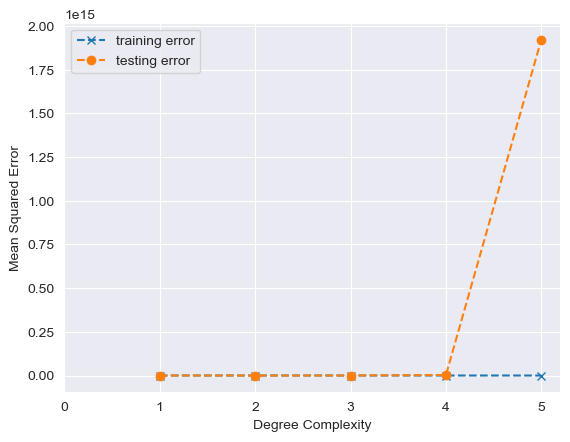

In [35]:
plt.plot(range(1, 6), train_mses, '--x', label = 'training error')
plt.plot(range(1, 6), test_mses, '--o', label = 'testing error')
plt.xticks(range(0, 6), range(0, 6))
plt.xlabel('Degree Complexity')
plt.ylabel('Mean Squared Error')
plt.legend();

In [36]:
best_complexity_n = test_mses_norm.index(min(test_mses_norm)) + 1
best_mse_n = min(test_mses_norm)

# Answer check
print(f'The best degree polynomial model is:  {best_complexity_n}')
print(f'The smallest mean squared error on the test data is : {best_mse_n: .2f}')

The best degree polynomial model is:  4
The smallest mean squared error on the test data is :  56276458330.18


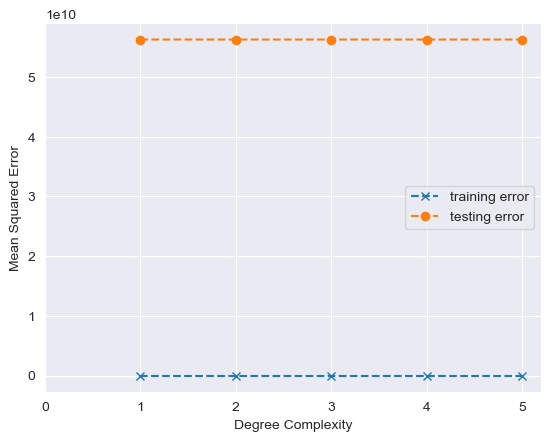

In [37]:
plt.plot(range(1, 6), train_mses_norm, '--x', label = 'training error')
plt.plot(range(1, 6), test_mses_norm, '--o', label = 'testing error')
plt.xticks(range(0, 6), range(0, 6))
plt.xlabel('Degree Complexity')
plt.ylabel('Mean Squared Error')
plt.legend();

In [38]:
df_complexity_n = pd.DataFrame()
df_complexity_n['mse_baseline_test'] = [mse_baseline_test]*5
df_complexity_n['test_mse'] = pd.Series(test_mses)
df_complexity_n['test_mse_norm'] = pd.Series(test_mses_norm)
df_complexity_n['train_mse'] = pd.Series(test_mses)
df_complexity_n['train_mse_norm'] = pd.Series(test_mses_norm)
df_complexity_n['mse_baseline_train'] = [mse_baseline_train]*5
df_complexity_n['r-sq'] = pd.Series(R_square)
df_complexity_n['r-sq_norm'] = pd.Series(R_square_norm)
df_complexity_n['mse_baseline_test'] = [mse_baseline_test]*5
df_complexity_n.set_index(pd.Index([1,2,3,4,5]), inplace=True)
df_complexity_n

,mse_baseline_test,test_mse,test_mse_norm,train_mse,train_mse_norm,mse_baseline_train,r-sq,r-sq_norm
1,1.332592e+10,4.919148e+09,5.627656e+10,4.919148e+09,5.627656e+10,1.331026e+10,0.636620,0.558482
2,1.332592e+10,4.371574e+09,5.627655e+10,4.371574e+09,5.627655e+10,1.331026e+10,0.704614,0.658676
3,1.332592e+10,6.215917e+09,5.627655e+10,6.215917e+09,5.627655e+10,1.331026e+10,0.758299,0.698521
4,1.332592e+10,2.881144e+12,5.627646e+10,2.881144e+12,5.627646e+10,1.331026e+10,0.765623,0.756240
5,1.332592e+10,1.922492e+15,5.628026e+10,1.922492e+15,5.628026e+10,1.331026e+10,0.793475,0.817040


In [39]:
create_table(df_complexity_n, index=True, index_title='degree')

### Best Degree Complexity

In [40]:
# Building a quadratic model
quad_poly_ordinal_oe = make_column_transformer((PolynomialFeatures(degree = 2), make_column_selector(dtype_include=np.number)), (OrdinalEncoder(), ['ocean_proximity']))
quad_pipe = Pipeline([('quad_transformer', quad_poly_ordinal_oe), ('quad_linreg', LinearRegression())])

#fit on train
quad_pipe.fit(X_train, y_train)
#R-squared
R_square_quad = quad_pipe.score(X_train, y_train)

#predict on train and test
X_train_pred_quad = quad_pipe.predict(X_train)
X_test_pred_quad = quad_pipe.predict(X_val)
#quad_pipe.fit(X_train, y)
Y_pred_quad = quad_pipe.predict(X) 



#create MSEs for train and test sets
train_mses_quad = mean_squared_error(y_train, X_train_pred_quad)
test_mses_quad = mean_squared_error(y_val, X_test_pred_quad)
quad_pipe

Pipeline(steps=[('quad_transformer',
                 ColumnTransformer(transformers=[('polynomialfeatures',
                                                  PolynomialFeatures(),
                                                  <sklearn.compose._column_transformer.make_column_selector object at 0x0000023415561350>),
                                                 ('ordinalencoder',
                                                  OrdinalEncoder(),
                                                  ['ocean_proximity'])])),
                ('quad_linreg', LinearRegression())])

In [41]:
cali['predict_house_value'] = pd.Series(Y_pred_quad)
cali['model_house_value'] = pd.Series(X_train_pred_quad)

### Best degree for Normalized Dataset

In [42]:
penta_poly_ordinal_oe = make_column_transformer((PolynomialFeatures(degree = 5), make_column_selector(dtype_include=np.number)), (OrdinalEncoder(), ['ocean_proximity']))
penta_pipe = Pipeline([('penta_transformer', penta_poly_ordinal_oe), ('penta_linreg', LinearRegression())])

#fit on train
penta_pipe.fit(X_norm_train, y_norm_train)
#R-squared
R_square_penta = penta_pipe.score(X_norm_train, y_norm_train)

#predict on train and test
X_train_pred_penta = penta_pipe.predict(X_norm_train)
X_test_pred_penta = penta_pipe.predict(X_norm_val)
#quad_pipe.fit(X_train, y)
#X_pred_penta = penta_pipe.predict(X)



#create MSEs for train and test sets
train_mses_penta = mean_squared_error(y_train, X_train_pred_penta)
test_mses_penta = mean_squared_error(y_val, X_test_pred_penta)
penta_pipe

Pipeline(steps=[('penta_transformer',
                 ColumnTransformer(transformers=[('polynomialfeatures',
                                                  PolynomialFeatures(degree=5),
                                                  <sklearn.compose._column_transformer.make_column_selector object at 0x0000023415562D50>),
                                                 ('ordinalencoder',
                                                  OrdinalEncoder(),
                                                  ['ocean_proximity'])])),
                ('penta_linreg', LinearRegression())])

In [43]:
cali_norm['predict_house_value'] = pd.Series(X_test_pred_penta)
cali_norm['model_house_value'] = pd.Series(X_train_pred_penta)

In [44]:
#X normalysed
X_norm

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,ocean_proximity
0,-1.135284,0.905189,0.910873,-1.374878,-1.705570,-1.732267,-1.664082,1.923747,0.893908
1,-1.123415,0.892038,-0.483658,1.839927,1.446104,1.201214,1.624101,1.918411,0.893908
2,-1.149742,0.886449,5.199338,-0.662203,-1.337127,-1.323952,-1.327982,1.632479,0.893908
3,-1.169401,0.886449,5.199338,-0.880888,-1.066304,-1.187827,-1.066304,1.073235,0.893908
4,-1.169401,0.886449,5.199338,-0.467895,-0.795322,-1.174387,-0.807429,0.188015,0.893908
...,...,...,...,...,...,...,...,...,...
20635,-0.405221,1.864320,-0.239380,-0.432563,-0.267884,-0.564267,-0.393847,-1.676469,0.257495
20636,-0.425228,1.867608,-0.702315,-1.596111,-1.574253,-1.652773,-1.713854,-0.687318,0.257495
20637,-0.427976,1.853811,-0.803958,0.093437,0.188033,-0.253606,0.105580,-1.488050,0.257495
20638,-0.485069,1.853811,-0.702315,-0.236799,-0.120731,-0.779924,-0.293986,-1.315001,0.257495


In [45]:
X

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,ocean_proximity
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,3.0
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,3.0
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,3.0
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,3.0
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,3.0
...,...,...,...,...,...,...,...,...,...
20635,-121.09,39.48,25.0,1665.0,374.0,845.0,330.0,1.5603,1.0
20636,-121.21,39.49,18.0,697.0,150.0,356.0,114.0,2.5568,1.0
20637,-121.22,39.43,17.0,2254.0,485.0,1007.0,433.0,1.7000,1.0
20638,-121.32,39.43,18.0,1860.0,409.0,741.0,349.0,1.8672,1.0


In [46]:
X_test_pred_quad

array([ 77001.91811453,  90518.11552891, 238687.71830926, ...,
       130604.47453542, 124375.67139775, 237482.93708626])

In [47]:
cali['median_house_value']

0        452600.0
1        358500.0
2        352100.0
3        341300.0
4        342200.0
           ...   
20635     78100.0
20636     77100.0
20637     92300.0
20638     84700.0
20639     89400.0
Name: median_house_value, Length: 20640, dtype: float64

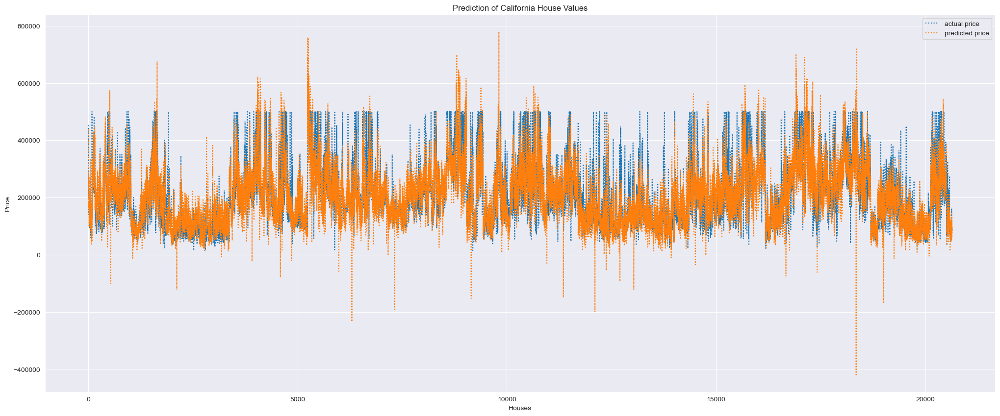

In [48]:
plt.figure(figsize=(25,10))
plt.plot(cali['median_house_value'], label = 'actual price', linestyle = 'dotted', )
plt.plot(pd.Series(Y_pred_quad), label = 'predicted price', linestyle = 'dotted')
#plt.xticks(range(0, 20640), range(0, 20640))
plt.xlabel('Houses')
plt.ylabel('Price')
plt.title('Prediction of California House Values')
plt.legend();

In [49]:
fig = px.scatter_mapbox(cali, #our data set
                        lat="latitude", lon="longitude", #location
                        color="predict_house_value", #select a column for ranking
                        hover_name="predict_house_value",
                        hover_data=["total_bedrooms", "total_rooms"],
                        color_discrete_sequence=["green"],
                        size_max=30,
                        zoom=5,
                        width=800, height=1000, #map size
                        title =  'Interactive Map of California area, check location')
#style of map
fig.update_layout(mapbox_style="open-street-map")
fig.show(config={'scrollZoom': False})

In [50]:
fig = px.scatter_mapbox(cali, #our data set
                        lat="latitude", lon="longitude", #location
                        color="model_house_value", #select a column for ranking
                        hover_name="model_house_value",
                        hover_data=["total_bedrooms", "total_rooms"],
                        color_discrete_sequence=["green"],
                        size_max=30,
                        zoom=5,
                        width=800, height=1000, #map size
                        title =  'Interactive Map of California area, check location')
#style of map
fig.update_layout(mapbox_style="open-street-map")
fig.show(config={'scrollZoom': False})

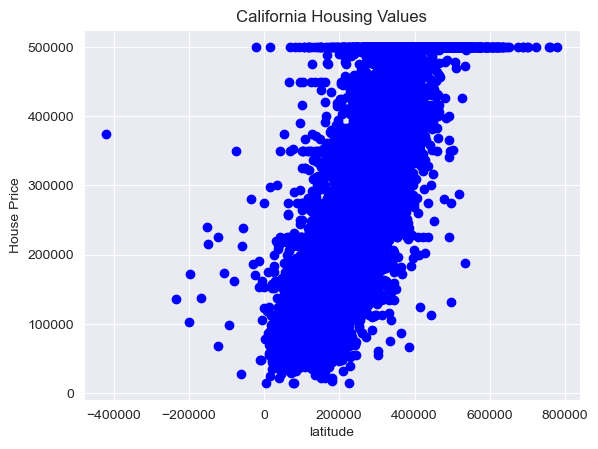

In [51]:
XQ = cali[['predict_house_value']].values
yq = y.values
XQ_grid = np.arange(min(XQ),max(XQ),0.1)
XQ_grid = XQ_grid.reshape(len(XQ_grid),1)

plt.scatter(XQ, yq, color='blue')
#plt.plot(XQ_grid, quad_pipe.named_steps['quad_linreg'].predict(quad_pipe.named_steps['quad_transformer'].fit_transform(cali[['predict_house_value']])),color='red')

plt.title("California Housing Values")
plt.xlabel('latitude')
plt.ylabel('House Price')
plt.show()

In [52]:
cali[['predict_house_value']]

,predict_house_value
0,386588.426545
1,440584.939745
2,384891.670053
3,330391.507230
4,251557.499075
...,...
20635,62514.466336
20636,100766.360750
20637,76066.450247
20638,80019.345542


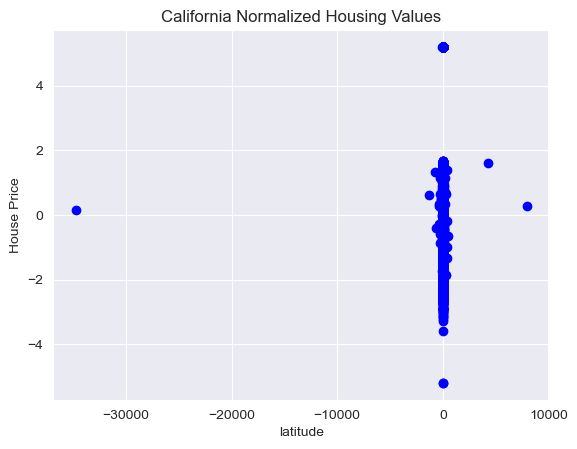

In [53]:
XQ = cali_norm[['predict_house_value']].values
yq = y_norm.values
XQ_grid = np.arange(min(XQ),max(XQ),0.1)
XQ_grid = XQ_grid.reshape(len(XQ_grid),1)

plt.scatter(XQ, yq, color='blue')
#plt.plot(XQ_grid, penta_pipe.named_steps['penta_linreg'].predict(penta_pipe.named_steps['penta_transformer'].fit_transform(XQ_grid)),color='red')

plt.title("California Normalized Housing Values")
plt.xlabel('latitude')
plt.ylabel('House Price')
plt.show()